## SkySat triplet point cloud metrics
David Shean  
August 20, 2020

In [1]:
import os
import rasterio as rio
from rasterio import plot
import glob
import matplotlib.pyplot as plt
from imview.lib import pltlib
import numpy as np
from pygeotools.lib import *

In [45]:
topdir = '/scr/skysat_rainier_PC_test'
%cd $topdir

/private/tmp/skysat_rainier_PC_test


In [76]:
!hs.sh *DEM.tif

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...

In [3]:
res_list = [1, 2, 3]

In [131]:
res=3

In [132]:
wmean_fn = glob.glob(os.path.join(topdir,'*{}m-DEM.tif'.format(res)))[0]
hs_fn = os.path.splitext(wmean_fn)[0]+'_hs_az315.tif'
med_fn = glob.glob(os.path.join(topdir,'*{}m-median-DEM.tif'.format(res)))[0]
min_fn = glob.glob(os.path.join(topdir,'*{}m-min-DEM.tif'.format(res)))[0]
max_fn = glob.glob(os.path.join(topdir,'*{}m-max-DEM.tif'.format(res)))[0]
nmad_fn = glob.glob(os.path.join(topdir,'*{}m-nmad-DEM.tif'.format(res)))[0]
count_fn = glob.glob(os.path.join(topdir,'*{}m-count-DEM.tif'.format(res)))[0]
err_fn = glob.glob(os.path.join(topdir,'*{}m-IntersectionErr.tif'.format(res)))[0]

In [133]:
mm = rio.open(max_fn).read(1, masked=True) - rio.open(min_fn).read(1, masked=True)

In [21]:
for res in res_list:
    wmean_fn = glob.glob(os.path.join(topdir,'*{}m-DEM.tif'.format(res)))[0]
    slope_fn = os.path.splitext(wmean_fn)[0]+'_slope.tif'
    !gdaldem slope $wmean_fn $slope_fn

0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.
0...10...20...30...40...50...60...70...80...90...100 - done.


In [135]:
clim=np.percentile(mm.compressed(), (2,98))

In [136]:
count = rio.open(count_fn).read(1, masked=True)
nmad = rio.open(nmad_fn).read(1, masked=True)
err = rio.open(err_fn).read(1, masked=True)
med = rio.open(med_fn).read(1, masked=True)
hs = rio.open(hs_fn).read(1, masked=True)
slope = rio.open(slope_fn).read(1, masked=True)

/Users/dshean/sw/miniconda3/envs/shean_py3_latest/lib/python3.8/site-packages/matplotlib/colors.py:576: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


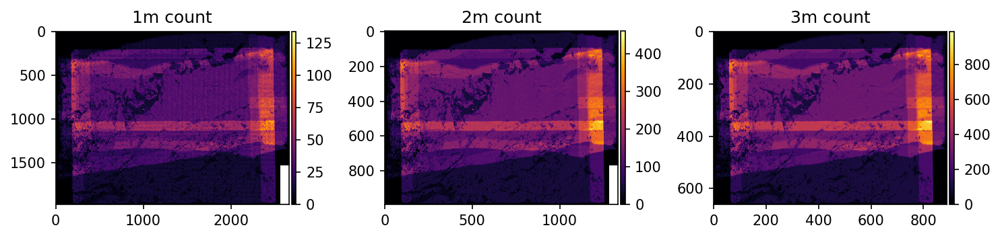

In [16]:
v = 'count'
f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v)))[0]
    m = axa[n].imshow(rio.open(fn).read(1, masked=True), cmap='inferno', interpolation='none')
    pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {}'.format(res, v))
plt.tight_layout()

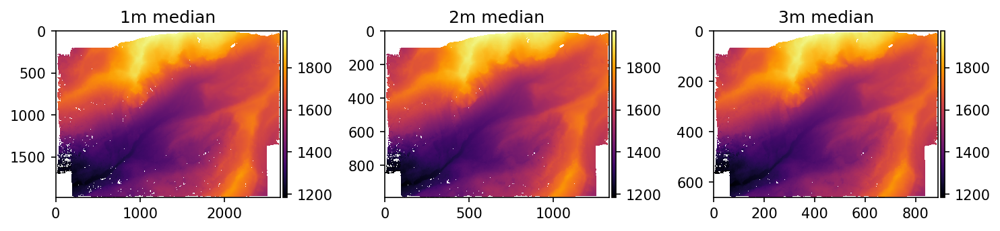

In [15]:
v = 'median'
f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v)))[0]
    m = axa[n].imshow(rio.open(fn).read(1, masked=True), cmap='inferno', interpolation='none')
    pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {}'.format(res, v))
plt.tight_layout()

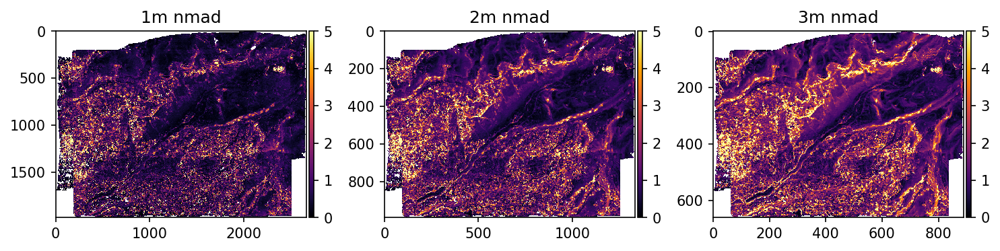

In [20]:
v = 'nmad'
clim = (0,5)
f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v)))[0]
    m = axa[n].imshow(rio.open(fn).read(1, masked=True), clim=clim, cmap='inferno', interpolation='none')
    pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {}'.format(res, v))
plt.tight_layout()

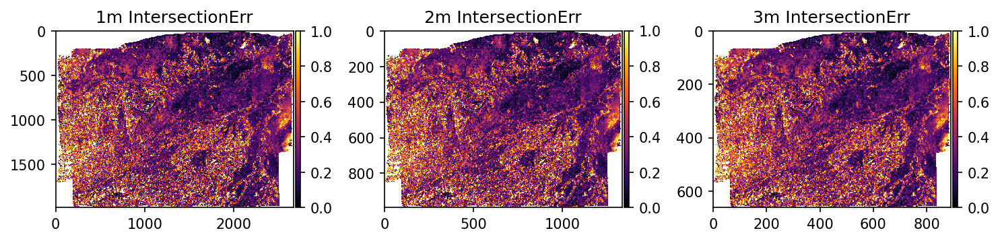

In [19]:
v = 'IntersectionErr'
clim=(0,1)
#clim=None
fn = glob.glob(os.path.join(topdir,'*{}m-{}.tif'.format(res,v)))[0]

f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    fn = glob.glob(os.path.join(topdir,'*{}m-{}.tif'.format(res,v)))[0]
    m = axa[n].imshow(rio.open(fn).read(1, masked=True), clim=clim, cmap='inferno', interpolation='none')
    pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {}'.format(res, v))
plt.tight_layout()

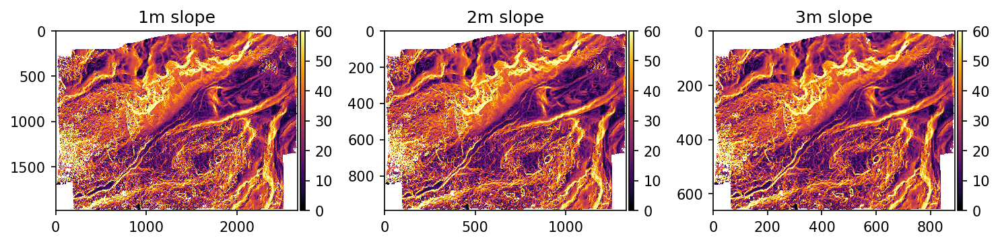

In [24]:
v = 'slope'
clim=(0,60)
#clim=None

f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    fn = glob.glob(os.path.join(topdir,'*{}m-DEM_{}.tif'.format(res,v)))[0]
    m = axa[n].imshow(rio.open(fn).read(1, masked=True), clim=clim, cmap='inferno', interpolation='none')
    pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {}'.format(res, v))
plt.tight_layout()

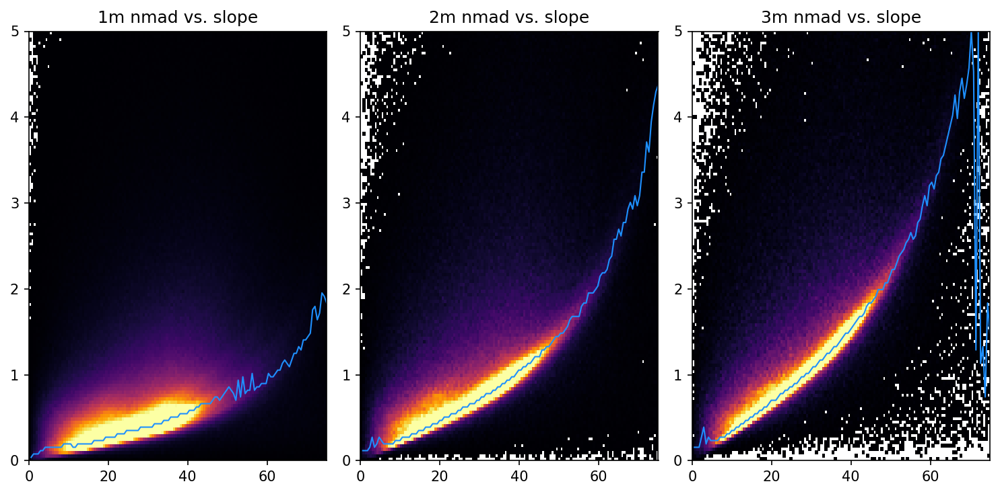

In [30]:
v1 = 'slope'
v2 = 'nmad'

f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    v1_fn = glob.glob(os.path.join(topdir,'*{}m-DEM_{}.tif'.format(res,v1)))[0]
    v2_fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v2)))[0]
    pltlib.plot_2dhist(axa[n], rio.open(v1_fn).read(1, masked=True), rio.open(v2_fn).read(1, masked=True), xlim=(0,75), ylim=(0,5))
    #pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {} vs. {}'.format(res, v2, v1))
plt.tight_layout()

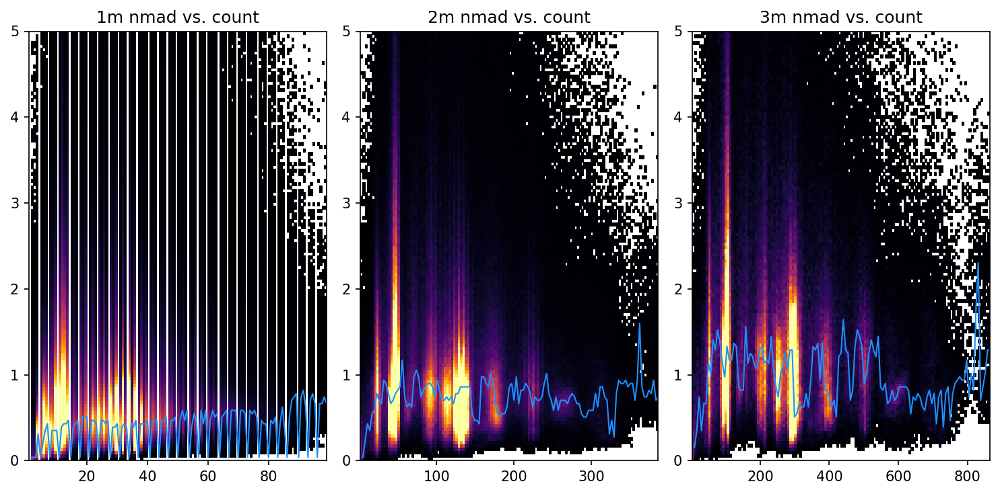

In [47]:
v1 = 'count'
v2 = 'nmad'

f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    v1_fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v1)))[0]
    v2_fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v2)))[0]
    pltlib.plot_2dhist(axa[n], rio.open(v1_fn).read(1, masked=True), rio.open(v2_fn).read(1, masked=True), ylim=(0,5))
    #pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {} vs. {}'.format(res, v2, v1))
plt.tight_layout()

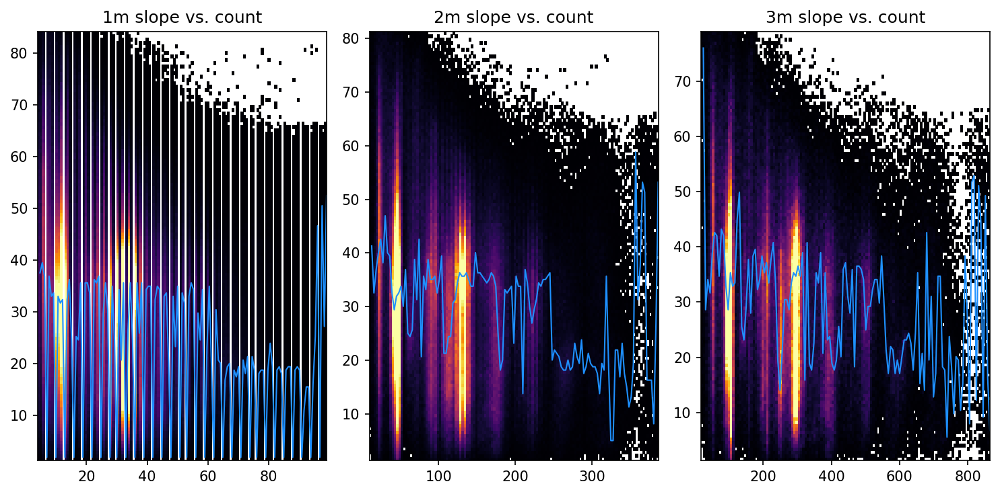

In [39]:
v1 = 'count'
v2 = 'slope'

f,axa = plt.subplots(1,3,figsize=(10,5),dpi=150)
for n, res in enumerate(res_list):
    v1_fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v1)))[0]
    v2_fn = glob.glob(os.path.join(topdir,'*{}m-DEM_{}.tif'.format(res,v2)))[0]
    pltlib.plot_2dhist(axa[n], rio.open(v1_fn).read(1, masked=True), rio.open(v2_fn).read(1, masked=True))
    #pltlib.add_cbar(axa[n], m);
    axa[n].set_title('{}m {} vs. {}'.format(res, v2, v1))
plt.tight_layout()

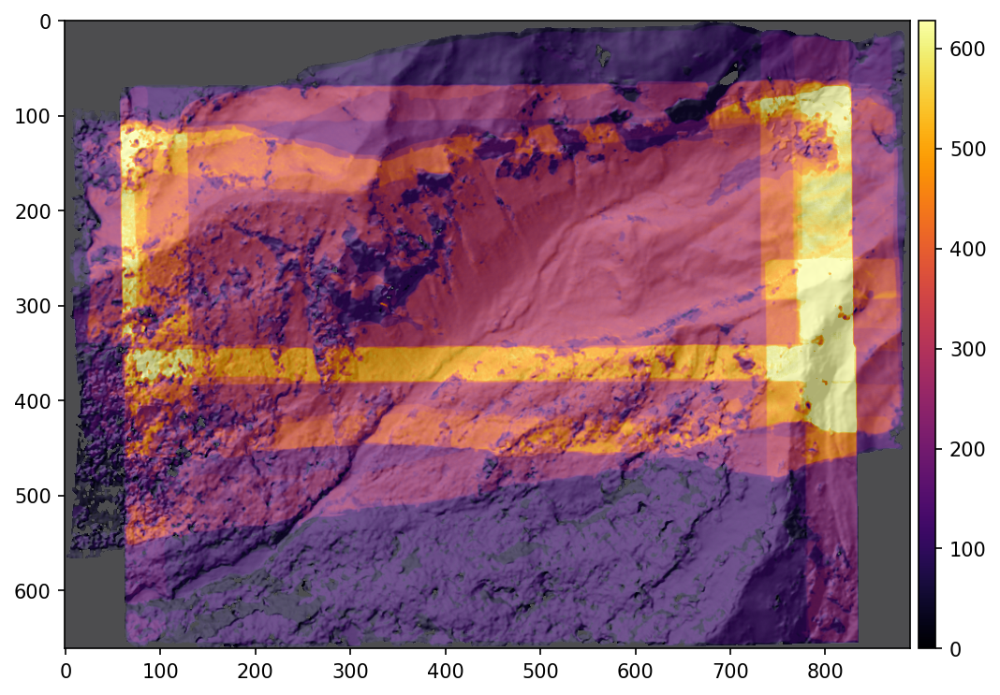

In [137]:
v = 'count'
clim=np.percentile(count.compressed(), (2,98))
fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v)))[0]

f,ax = plt.subplots(figsize=(8,8), dpi=150)
ax.imshow(hs, cmap='gray')
m = ax.imshow(count, clim=clim, alpha=0.7, cmap='inferno')
#m = ax.imshow(rio.open(fn).read(1, masked=True), clim=clim, alpha=0.7, cmap='inferno')
pltlib.add_cbar(ax,m);

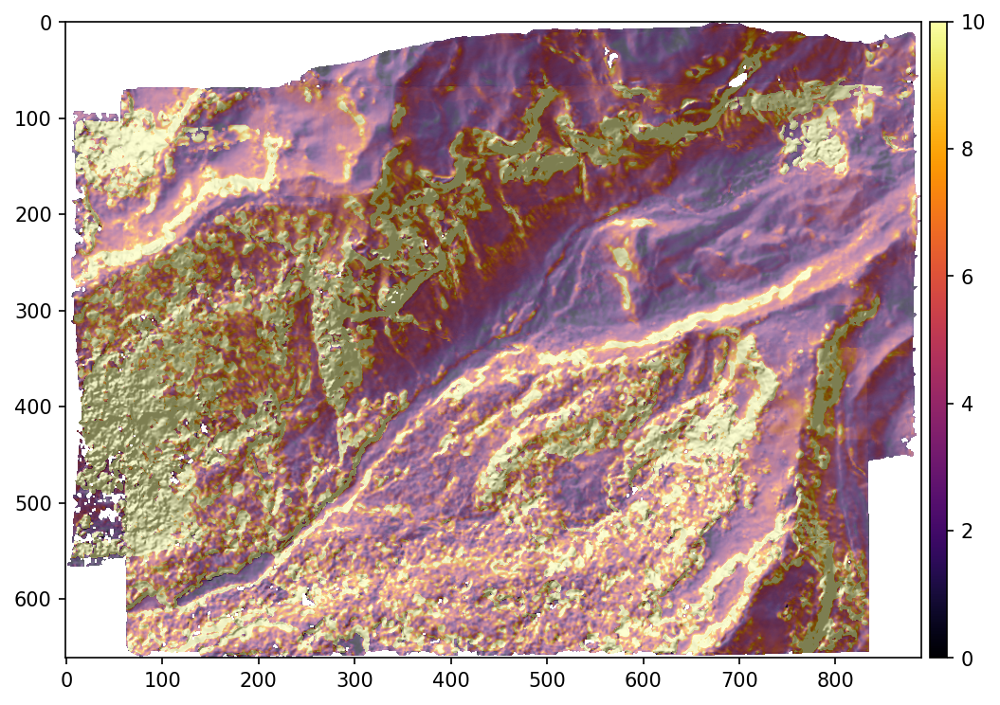

In [138]:
v = 'mm'
clim=(0,10)

f,ax = plt.subplots(figsize=(8,8), dpi=150)
ax.imshow(hs, cmap='gray')
#m = ax.imshow(count, clim=(1,40), alpha=0.7, cmap='inferno')
#m = ax.imshow(rio.open(fn).read(1, masked=True), clim=clim, alpha=0.7, cmap='inferno')
m = ax.imshow(mm, clim=clim, alpha=0.5, cmap='inferno')
pltlib.add_cbar(ax,m);
#plt.colorbar(m)

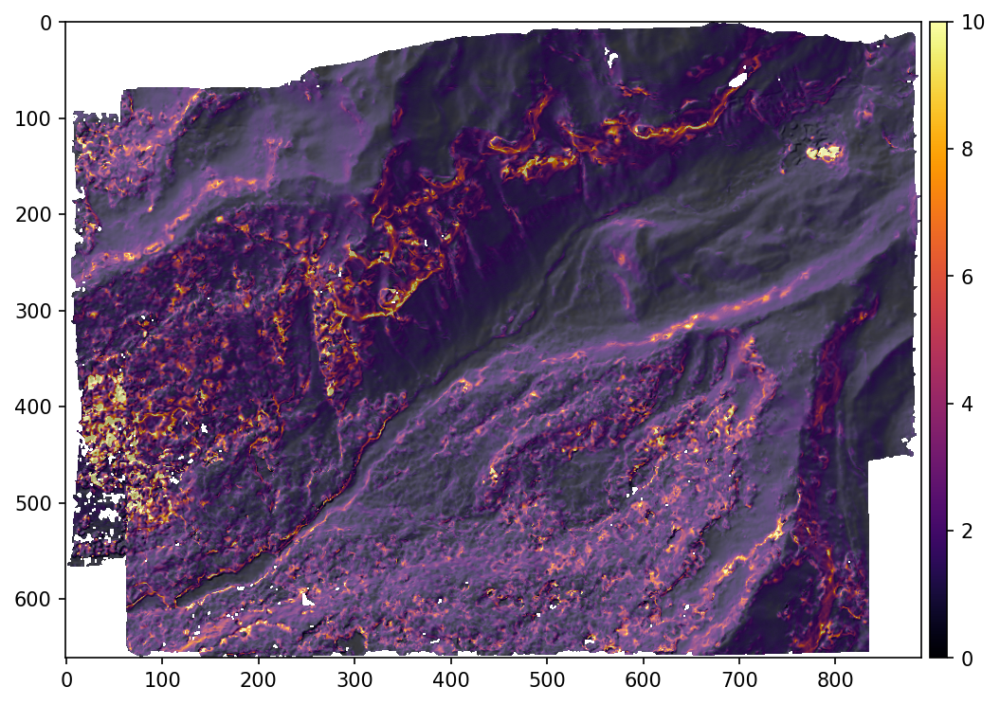

In [139]:
v = 'nmad'
clim=(0,10)
#clim=None
fn = glob.glob(os.path.join(topdir,'*{}m-{}-DEM.tif'.format(res,v)))[0]

f,ax = plt.subplots(figsize=(8,8), dpi=150)
ax.imshow(hs, cmap='gray')
#m = ax.imshow(count, clim=(1,40), alpha=0.7, cmap='inferno')
m = ax.imshow(rio.open(fn).read(1, masked=True), clim=clim, alpha=0.7, cmap='inferno')
pltlib.add_cbar(ax,m);

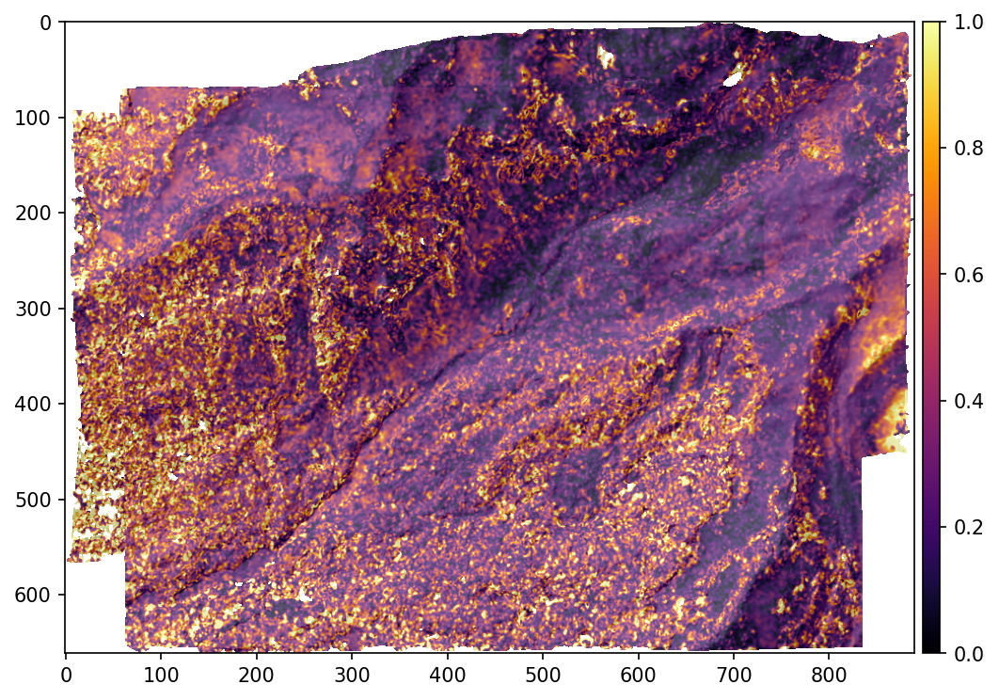

In [140]:
v = 'IntersectionErr'
clim=(0,1)
#clim=None
fn = glob.glob(os.path.join(topdir,'*{}m-{}.tif'.format(res,v)))[0]

f,ax = plt.subplots(figsize=(8,8), dpi=150)
ax.imshow(hs, cmap='gray')
#m = ax.imshow(count, clim=(1,40), alpha=0.7, cmap='inferno')
m = ax.imshow(rio.open(fn).read(1, masked=True), clim=clim, alpha=0.7, cmap='inferno')
pltlib.add_cbar(ax,m);

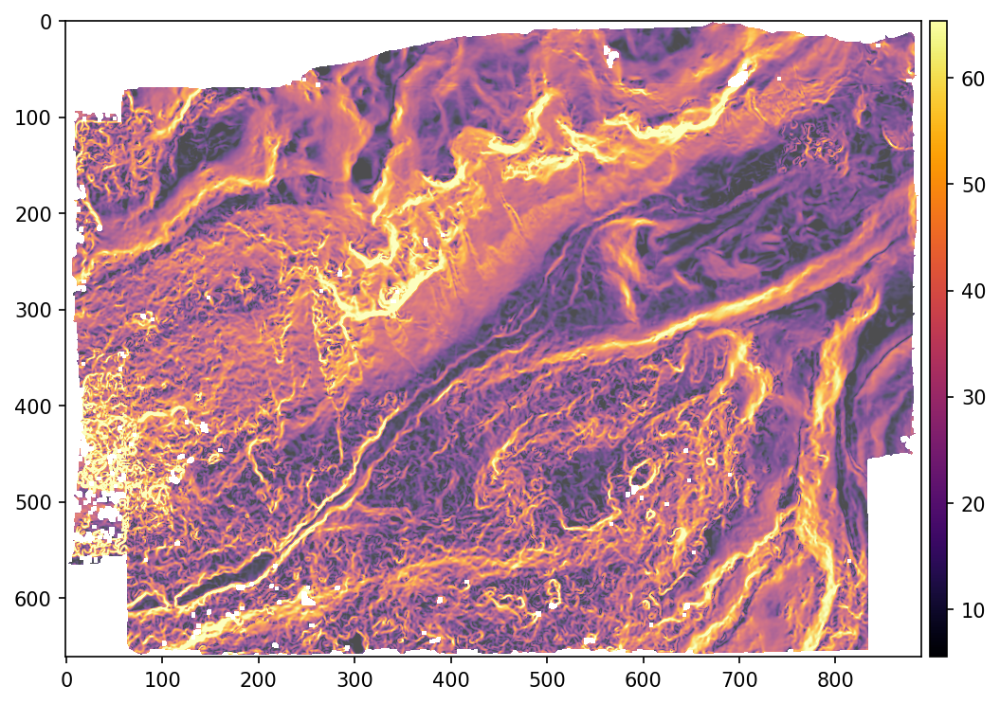

In [141]:
v = 'slope'
#clim=(0,1)
#clim=None
clim=np.percentile(slope.compressed(), (2,98))
fn = glob.glob(os.path.join(topdir,'*{}m-DEM_{}.tif'.format(res,v)))[0]

f,ax = plt.subplots(figsize=(8,8), dpi=150)
#ax.imshow(hs, cmap='gray')
#m = ax.imshow(count, clim=(1,40), alpha=0.7, cmap='inferno')
m = ax.imshow(rio.open(fn).read(1, masked=True), clim=clim, alpha=0.7, cmap='inferno')
pltlib.add_cbar(ax,m);

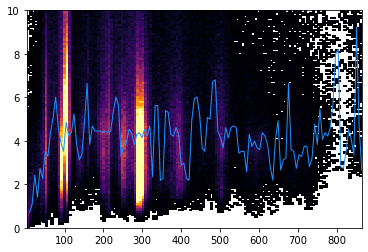

In [145]:
f, ax = plt.subplots()
pltlib.plot_2dhist(ax, count, mm, ylim=(0,10))

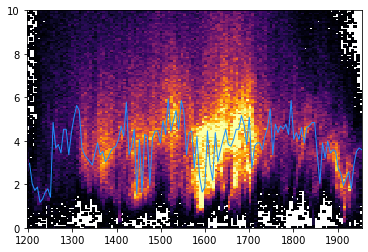

In [146]:
f, ax = plt.subplots()
pltlib.plot_2dhist(ax, med, mm, ylim=(0,10))